# Develop a model that can accurately recognize food items from images and estimate their calorie content, enabling users to track their dietary intake and make informed food choices.

In [1]:
import tensorflow as tf
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow import keras
from tensorflow.keras import models
import cv2

In [2]:
# Check if GPU is enabled
print(tf.__version__)
print(tf.test.gpu_device_name())

2.17.0



In [3]:
import os

def get_data_extract(path="D:/archive/food-101"):
    if os.path.exists(path):
        print("Dataset already exists at:", path)
    else:
        print("Downloading the data...")
        os.system('wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz')
        print("Dataset downloaded!")
        print("Extracting data...")
        os.system('tar xzvf food-101.tar.gz')
        print("Extraction done!")


* **Commented the below cell as the Food-101 dataset is available from Kaggle Datasets and need not be downloaded..**

In [4]:
# Download data and extract it to folder

get_data_extract()

Dataset already exists at: D:/archive/food-101


### **Understand dataset structure and files**

In [5]:
import os

# Correct path to the images folder
path = "D:/archive/food-101/food-101/images"

# List the contents of the images folder
food_categories = os.listdir(path)
print("Contents of", path, ":")
for category in food_categories:
    print(category)


Contents of D:/archive/food-101/food-101/images :
creme_brulee
croque_madame
cup_cakes
deviled_eggs
donuts
dumplings
edamame
eggs_benedict
escargots
falafel
filet_mignon
fish_and_chips
foie_gras
french_fries
french_onion_soup
french_toast
fried_calamari
fried_rice
frozen_yogurt
garlic_bread
gnocchi
greek_salad
grilled_cheese_sandwich
grilled_salmon
guacamole
gyoza
hamburger
hot_and_sour_soup
hot_dog
huevos_rancheros
hummus
ice_cream
lasagna
lobster_bisque
lobster_roll_sandwich
macaroni_and_cheese
macarons
miso_soup
mussels
nachos
omelette
onion_rings
oysters
pad_thai
paella
pancakes
panna_cotta
peking_duck
pho
pizza
pork_chop
poutine
prime_rib
pulled_pork_sandwich
ramen
ravioli
red_velvet_cake
risotto
samosa
sashimi
scallops
seaweed_salad
shrimp_and_grits
spaghetti_bolognese
spaghetti_carbonara
spring_rolls
steak
strawberry_shortcake
sushi
tacos
takoyaki
tiramisu
tuna_tartare
waffles


In [6]:
import os

# Correct path to the meta folder
path = "D:/archive/food-101/food-101/meta"

# List the contents of the meta folder
meta_files = os.listdir(path)
print("Contents of", path, ":")
for file in meta_files:
    print(file)


Contents of D:/archive/food-101/food-101/meta :
classes.txt
labels.txt
test.json
test.txt
train.json
train.txt


In [7]:
# Path to the train.txt file
path = "D:/archive/food-101/food-101/meta/train.txt"

# Open and read the first 10 lines of train.txt
with open(path, 'r') as file:
    for i in range(10):  # Read the first 10 lines
        line = file.readline().strip()  # Remove any extra whitespace/newline
        print(line)


apple_pie/1005649
apple_pie/1014775
apple_pie/1026328
apple_pie/1028787
apple_pie/1043283
apple_pie/1050519
apple_pie/1057749
apple_pie/1057810
apple_pie/1072416
apple_pie/1074856


In [8]:
# Path to the classes.txt file
path = "D:/archive/food-101/food-101/meta/classes.txt"

# Open and read the first 10 lines of classes.txt
with open(path, 'r') as file:
    for i in range(10):  # Read the first 10 lines
        line = file.readline().strip()  # Remove any extra whitespace/newline
        print(line)


apple_pie
baby_back_ribs
baklava
beef_carpaccio
beef_tartare
beet_salad
beignets
bibimbap
bread_pudding
breakfast_burrito


### **Visualize random image from each of the 101 classes**

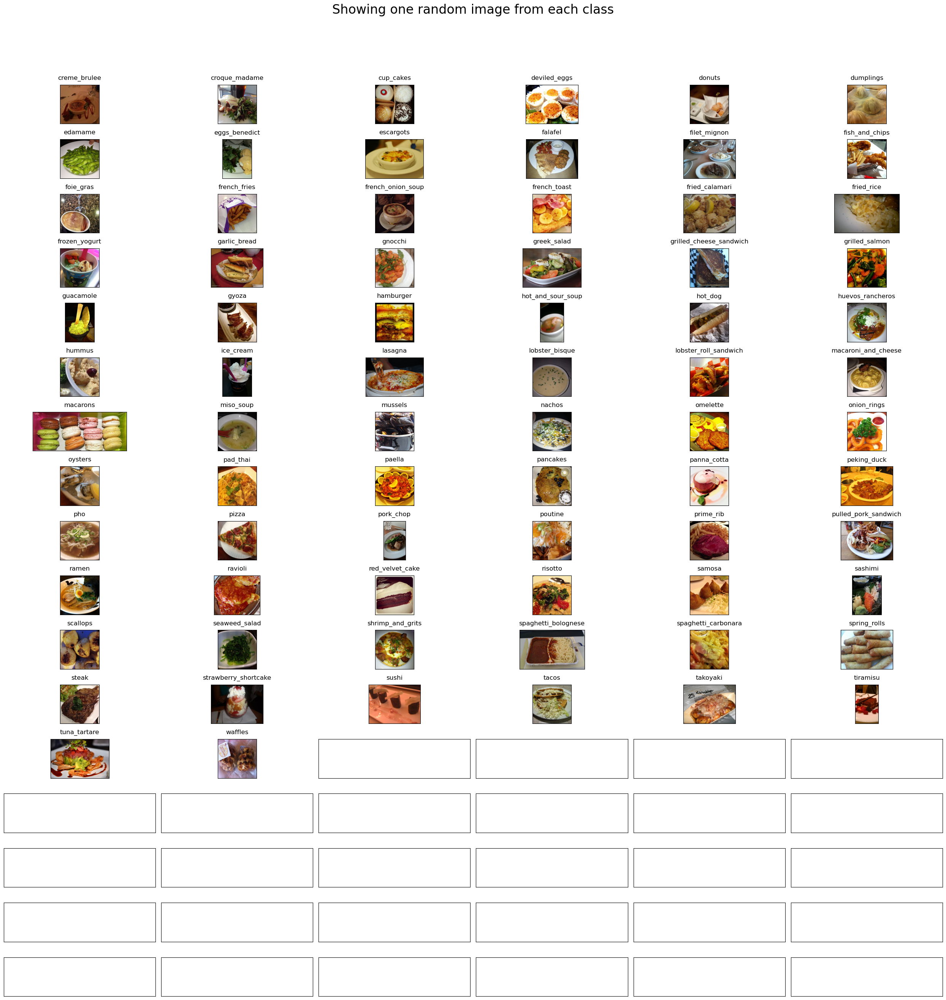

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Path to the images directory
data_dir = "D:/archive/food-101/food-101/images/"

# Sorting food categories (directories) in the images folder
foods_sorted = sorted(os.listdir(data_dir))

# Number of rows and columns for the plot
rows = 17
cols = 6

# Create a subplot grid
fig, ax = plt.subplots(rows, cols, figsize=(25, 25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24)  # Title above the grid

food_id = 0  # Start from the first food category
for i in range(rows):
    for j in range(cols):
        try:
            # Get the current food class (category)
            food_selected = foods_sorted[food_id]
            food_id += 1
        except IndexError:
            # If there are no more food categories, break the loop
            break
        
        # Skip any unexpected files like `.DS_Store`
        if food_selected == '.DS_Store':
            continue
        
        # Get the list of images for the current food class
        food_selected_images = os.listdir(os.path.join(data_dir, food_selected))
        
        # Pick one random image from the class
        food_selected_random = np.random.choice(food_selected_images)
        
        # Read the image
        img = plt.imread(os.path.join(data_dir, food_selected, food_selected_random))
        
        # Show the image in the grid
        ax[i][j].imshow(img)
        ax[i][j].set_title(food_selected, pad=10)
        
# Remove axis ticks
plt.setp(ax, xticks=[], yticks=[])

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()


### **Split the image data into train and test using train.txt and test.txt**

In [10]:
import os
from shutil import copy
from collections import defaultdict

# Helper method to split dataset into train and test folders
def prepare_data(filepath, src, dest):
    classes_images = defaultdict(list)
    
    # Open and read paths from the provided file (train.txt or test.txt)
    with open(filepath, 'r') as txt:
        paths = [read.strip() for read in txt.readlines()]
        
        # Organize images into their respective food categories
        for p in paths:
            food = p.split('/')  # Split the path into food category and image
            classes_images[food[0]].append(food[1])  # Add image name without extension

    # Now copy images to the corresponding folder in the destination
    for food in classes_images.keys():
        print(f"\nCopying images into {food}...")
        
        # Create the food category folder in destination if it doesn't exist
        food_dir = os.path.join(dest, food)
        if not os.path.exists(food_dir):
            os.makedirs(food_dir)
        
        # Copy each image to the respective folder
        for image in classes_images[food]:
            src_image_path = os.path.join(src, food, image)  # Source path
            
            # Check if the image has a proper extension
            if not src_image_path.endswith('.jpg'):
                src_image_path += '.jpg'  # Append .jpg if missing
                
            dest_image_path = os.path.join(food_dir, image)  # Destination path
            
            # Print full path being checked for debugging
            print(f"Checking if {src_image_path} exists...")  # Debug print
            if os.path.exists(src_image_path):
                copy(src_image_path, dest_image_path)
            else:
                print(f"Warning: {src_image_path} does not exist!")
    
    print("Copying Done!")


In [14]:
def prepare_data(filepath, src, dest):
    classes_images = defaultdict(list)
    
    with open(filepath, 'r') as txt:
        paths = [read.strip() for read in txt.readlines()]
        
        # Print out all paths for debugging
        print("Paths in train.txt:")
        print(paths)
        
        for p in paths:
            food = p.split('/')
            classes_images[food[0]].append(food[1])
    
    for food in classes_images.keys():
        print(f"\nCopying images into {food}...")
        food_dir = os.path.join(dest, food)
        if not os.path.exists(food_dir):
            os.makedirs(food_dir)
        
        for image in classes_images[food]:
            src_image_path = os.path.join(src, food, image)
            if not src_image_path.endswith('.jpg'):
                src_image_path += '.jpg'  # Append .jpg if missing
                
            dest_image_path = os.path.join(food_dir, image)
            
            # Print full path for debugging
            print(f"Checking if {src_image_path} exists...")
            if os.path.exists(src_image_path):
                copy(src_image_path, dest_image_path)
            else:
                print(f"Warning: {src_image_path} does not exist!")
    
    print("Copying Done!")


In [16]:
print("Creating train data...")
prepare_data(r"D:/archive/food-101/food-101/meta/train.txt", 
             "D:/archive/food-101/food-101/images", 
             'train')


Creating train data...
Paths in train.txt:
['apple_pie/1005649', 'apple_pie/1014775', 'apple_pie/1026328', 'apple_pie/1028787', 'apple_pie/1043283', 'apple_pie/1050519', 'apple_pie/1057749', 'apple_pie/1057810', 'apple_pie/1072416', 'apple_pie/1074856', 'apple_pie/1074942', 'apple_pie/1076891', 'apple_pie/1077610', 'apple_pie/1077964', 'apple_pie/1088809', 'apple_pie/1097378', 'apple_pie/1103795', 'apple_pie/1109597', 'apple_pie/1111062', 'apple_pie/1112300', 'apple_pie/1112838', 'apple_pie/1121884', 'apple_pie/112378', 'apple_pie/1133267', 'apple_pie/1142597', 'apple_pie/1147371', 'apple_pie/1154371', 'apple_pie/1158360', 'apple_pie/1159801', 'apple_pie/1165004', 'apple_pie/1166116', 'apple_pie/1166210', 'apple_pie/116697', 'apple_pie/1174241', 'apple_pie/1174949', 'apple_pie/1177254', 'apple_pie/118237', 'apple_pie/1184568', 'apple_pie/1185445', 'apple_pie/1185654', 'apple_pie/1191665', 'apple_pie/1196628', 'apple_pie/1199851', 'apple_pie/1200079', 'apple_pie/1214326', 'apple_pie/121

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Checking if D:/archive/food-101/food-101/images\creme_brulee\3833876.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3835253.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3835744.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3837134.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3843982.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3858602.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3865850.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3868924.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3876474.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3879767.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\3881312.jpg exists...
Checking if D:/archive/food-101/food-101/images\creme_brulee\388802.jpg exists...
Check

In [17]:
print("Creating test data...")
prepare_data(r"D:/archive/food-101/food-101/meta/test.txt", 
             "D:/archive/food-101/food-101/images", 
             'test')


Creating test data...
Paths in train.txt:
['apple_pie/1011328', 'apple_pie/101251', 'apple_pie/1034399', 'apple_pie/103801', 'apple_pie/1038694', 'apple_pie/1047447', 'apple_pie/1068632', 'apple_pie/110043', 'apple_pie/1106961', 'apple_pie/1113017', 'apple_pie/116705', 'apple_pie/1167170', 'apple_pie/1174330', 'apple_pie/1180600', 'apple_pie/1235282', 'apple_pie/1269202', 'apple_pie/1272958', 'apple_pie/1284428', 'apple_pie/1295996', 'apple_pie/129668', 'apple_pie/1321400', 'apple_pie/1327259', 'apple_pie/1332030', 'apple_pie/1364847', 'apple_pie/1375404', 'apple_pie/1398774', 'apple_pie/1420999', 'apple_pie/1429866', 'apple_pie/1444702', 'apple_pie/1461580', 'apple_pie/1469191', 'apple_pie/1472631', 'apple_pie/1510125', 'apple_pie/1510930', 'apple_pie/1514110', 'apple_pie/1526484', 'apple_pie/1578710', 'apple_pie/1579622', 'apple_pie/1579774', 'apple_pie/1617515', 'apple_pie/1617793', 'apple_pie/1626685', 'apple_pie/1629072', 'apple_pie/1657587', 'apple_pie/1674492', 'apple_pie/168971

In [41]:
import os

train_dir = r"D:\archive\food-101\food-101\train"  # Replace with your actual train directory path

# Recursively count all files and directories
total_files_dirs = sum([len(files) for r, d, files in os.walk(train_dir)]) + sum([len(dirs) for r, dirs, files in os.walk(train_dir)])

print(f"Total number of files and directories in train folder: {total_files_dirs}")


Total number of files and directories in train folder: 101


In [42]:
import os

test_dir = r"D:\archive\food-101\food-101\test"  # Replace with your actual test directory path

# Recursively count all files and directories
total_files_dirs = sum([len(files) for r, d, files in os.walk(test_dir)]) + sum([len(dirs) for r, dirs, files in os.walk(test_dir)])

print(f"Total number of files and directories in test folder: {total_files_dirs}")


Total number of files and directories in test folder: 101


In [17]:
os.chdir('/')

### **Create a subset of data with few classes(3) - train_mini and test_mini for experimenting**

In [26]:
# List of all 101 types of foods(sorted alphabetically)
del foods_sorted[0] # remove .DS_Store from the list

In [27]:
foods_sorted

['croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster_roll_sandwich',
 'macaroni_and_cheese',
 'macarons',
 'miso_soup',
 'mussels',
 'nachos',
 'omelette',
 'onion_rings',
 'oysters',
 'pad_thai',
 'paella',
 'pancakes',
 'panna_cotta',
 'peking_duck',
 'pho',
 'pizza',
 'pork_chop',
 'poutine',
 'prime_rib',
 'pulled_pork_sandwich',
 'ramen',
 'ravioli',
 'red_velvet_cake',
 'risotto',
 'samosa',
 'sashimi',
 'scallops',
 'seaweed_salad',
 'shrimp_and_grits',
 'spaghetti_bolognese',
 'spaghetti_carbonara',
 

In [28]:
# Helper method to create train_mini and test_mini data samples
def dataset_mini(food_list, src, dest):
  if os.path.exists(dest):
    rmtree(dest) # removing dataset_mini(if it already exists) folders so that we will have only the classes that we want
  os.makedirs(dest)
  for food_item in food_list :
    print("Copying images into",food_item)
    copytree(os.path.join(src,food_item), os.path.join(dest,food_item))
      

In [29]:
# picking 3 food items and generating separate data folders for the same
food_list = ['apple_pie','pizza','omelette']
src_train = 'train'
dest_train = 'train_mini/'
src_test = 'test'
dest_test = 'test_mini/'

In [30]:
print("Creating train data folder with new classes")
dataset_mini(food_list, src_train, dest_train)

Creating train data folder with new classes
Copying images into apple_pie
Copying images into pizza
Copying images into omelette


In [33]:
print("Creating test data folder with new classes")
dataset_mini(food_list, src_test, dest_test)

Creating test data folder with new classes
Copying images into apple_pie
Copying images into pizza
Copying images into omelette


In [38]:
import os

# Specify the path to the test folder
test_dir = r"D:\archive\food-101\food-101\test"

# Recursively count all files and directories
total_files_dirs = sum([len(files) for r, d, files in os.walk(test_dir)]) + sum([len(dirs) for r, dirs, files in os.walk(test_dir)])

print(f"Total number of files and directories in test folder: {total_files_dirs}")


Total number of files and directories in test folder: 101


In [37]:
import os

# Specify the path to the train folder
train_dir = r"D:\archive\food-101\food-101\train"

# Recursively count all files and directories
total_files_dirs = sum([len(files) for r, d, files in os.walk(train_dir)]) + sum([len(dirs) for r, dirs, files in os.walk(train_dir)])

print(f"Total number of files and directories in train folder: {total_files_dirs}")


Total number of files and directories in train folder: 101


### **Fine tune ResNet50 Pretrained model using Food 101 dataset**

In [45]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
from tensorflow.keras import backend as K

# Clear any previous session
K.clear_session()

# Parameters
n_classes = 3
img_width, img_height = 224, 224
train_data_dir = 'train_mini'  # Directory for train images
validation_data_dir = 'test_mini'  # Directory for test images
nb_train_samples = 2250  # Total number of training samples
nb_validation_samples = 750  # Total number of validation samples
batch_size = 16

# Data generators for image augmentation and rescaling
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

# Train and validation generators
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

# Load ResNet50 model with ImageNet weights (exclude top layer for fine-tuning)
resnet50 = ResNet50(weights='imagenet', include_top=False)
x = resnet50.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)

# Output layer with 3 classes
predictions = Dense(n_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

# Create the final model
model = Model(inputs=resnet50.input, outputs=predictions)

# Compile the model
model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks for saving the best model and logging training history
checkpointer = ModelCheckpoint(filepath='best_model_3class.keras', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_3class.log')

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size,
    epochs=30,
    verbose=1,
    callbacks=[csv_logger, checkpointer]
)

# Save the final trained model
model.save('model_trained_3class.keras')


Found 0 images belonging to 3 classes.
Found 0 images belonging to 3 classes.


ValueError: Must provide at least one structure

In [52]:
class_map_3 = train_generator.class_indices
class_map_3

{'apple_pie': 0, 'omelette': 1, 'pizza': 2}

### **Visualize the accuracy and loss plots**

In [53]:
def plot_accuracy(history,title):
    plt.title(title)
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train_accuracy', 'validation_accuracy'], loc='best')
    plt.show()
def plot_loss(history,title):
    plt.title(title)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train_loss', 'validation_loss'], loc='best')
    plt.show()

In [54]:
plot_accuracy(history,'FOOD101-ResNet50')
plot_loss(history,'FOOD101-ResNet50')

NameError: name 'history' is not defined

### **Predicting classes for new images from internet using the best trained model**

In [30]:
%%time
# Loading the best saved model to make predictions
K.clear_session()
model_best = load_model('/kaggle/working/best_model_3class.hdf5',compile = False)

CPU times: user 6.64 s, sys: 194 ms, total: 6.84 s
Wall time: 6.79 s


In [31]:
def predict_class(model, images, show = True):
  for img in images:
    img = image.load_img(img, target_size=(224, 224))
    img = image.img_to_array(img)                    
    img = np.expand_dims(img, axis=0)         
    img /= 255.                                      

    pred = model.predict(img)
    index = np.argmax(pred)
    food_list.sort()
    pred_value = food_list[index]
    if show:
        plt.imshow(img[0])                           
        plt.axis('off')
        plt.title(pred_value)
        plt.show()

In [55]:
# Make a list of downloaded images and test the trained model
images = []
images.append('applepie.jpg')
images.append('pizza.jpg')
images.append('omelette.jpg')
predict_class(model_best, images, True)

NameError: name 'predict_class' is not defined

### **Fine tune ResNet50 model with 11 classes of data**

In [36]:
# Helper function to select n random food classes
def pick_n_random_classes(n):
  food_list = []
  random_food_indices = random.sample(range(len(foods_sorted)),n) # We are picking n random food classes
  for i in random_food_indices:
    food_list.append(foods_sorted[i])
  food_list.sort()
  return food_list

In [37]:
# Lets try with more classes than just 3. Also, this time lets randomly pick the food classes
n = 11
food_list = pick_n_random_classes(n)
food_list = ['apple_pie', 'beef_carpaccio', 'bibimbap', 'cup_cakes', 'foie_gras', 'french_fries', 'garlic_bread', 'pizza', 'spring_rolls', 'spaghetti_carbonara', 'strawberry_shortcake']
print("These are the randomly picked food classes we will be training the model on...\n", food_list)

These are the randomly picked food classes we will be training the model on...
 ['apple_pie', 'beef_carpaccio', 'bibimbap', 'cup_cakes', 'foie_gras', 'french_fries', 'garlic_bread', 'pizza', 'spring_rolls', 'spaghetti_carbonara', 'strawberry_shortcake']


In [38]:
# Create the new data subset of n classes
print("Creating training data folder with new classes...")
dataset_mini(food_list, src_train, dest_train)

Creating training data folder with new classes...
Copying images into apple_pie
Copying images into beef_carpaccio
Copying images into bibimbap
Copying images into cup_cakes
Copying images into foie_gras
Copying images into french_fries
Copying images into garlic_bread
Copying images into pizza
Copying images into spring_rolls
Copying images into spaghetti_carbonara
Copying images into strawberry_shortcake


In [39]:
print("Total number of samples in train folder")
!find train_mini/ -type d -or -type f -printf '.' | wc -c

Total number of samples in train folder
8250


In [40]:
print("Creating test data folder with new classes")
dataset_mini(food_list, src_test, dest_test)

Creating test data folder with new classes
Copying images into apple_pie
Copying images into beef_carpaccio
Copying images into bibimbap
Copying images into cup_cakes
Copying images into foie_gras
Copying images into french_fries
Copying images into garlic_bread
Copying images into pizza
Copying images into spring_rolls
Copying images into spaghetti_carbonara
Copying images into strawberry_shortcake


In [41]:
print("Total number of samples in test folder")
!find test_mini/ -type d -or -type f -printf '.' | wc -c

Total number of samples in test folder
2750


In [42]:
# Let's use a pretrained Inceptionv3 model on subset of data with 11 food classes
K.clear_session()

n_classes = n
img_width, img_height = 224, 224
train_data_dir = 'train_mini'
validation_data_dir = 'test_mini'
nb_train_samples = 8250 #75750
nb_validation_samples = 2750 #25250
batch_size = 16

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')


resnet50 = ResNet50(weights='imagenet', include_top=False)
x = resnet50.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(n,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=resnet50.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='best_model_11class.hdf5', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_11class.log')

history_11class = model.fit_generator(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=30,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

model.save('model_trained_11class.hdf5')

Found 8250 images belonging to 11 classes.
Found 2750 images belonging to 11 classes.


/opt/conda/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


Epoch 1/30
514/515 [============================>.] - ETA: 0s - loss: 2.0506 - acc: 0.3578
Epoch 00001: val_loss improved from inf to 2.63834, saving model to /kaggle/working/best_model_11class.hdf5
515/515 [==============================] - 163s 316ms/step - loss: 2.0494 - acc: 0.3581 - val_loss: 2.6383 - val_acc: 0.1758
Epoch 2/30
514/515 [============================>.] - ETA: 0s - loss: 1.1769 - acc: 0.6723
Epoch 00002: val_loss improved from 2.63834 to 0.78432, saving model to /kaggle/working/best_model_11class.hdf5
515/515 [==============================] - 148s 287ms/step - loss: 1.1759 - acc: 0.6725 - val_loss: 0.7843 - val_acc: 0.7855
Epoch 3/30
514/515 [============================>.] - ETA: 0s - loss: 0.9007 - acc: 0.7499
Epoch 00003: val_loss improved from 0.78432 to 0.57513, saving model to /kaggle/working/best_model_11class.hdf5
515/515 [==============================] - 148s 287ms/step - loss: 0.9000 - acc: 0.7501 - val_loss: 0.5751 - val_acc: 0.8465
Epoch 4/30
514/515 [

In [43]:
class_map_11 = train_generator.class_indices
class_map_11

{'apple_pie': 0,
 'beef_carpaccio': 1,
 'bibimbap': 2,
 'cup_cakes': 3,
 'foie_gras': 4,
 'french_fries': 5,
 'garlic_bread': 6,
 'pizza': 7,
 'spaghetti_carbonara': 8,
 'spring_rolls': 9,
 'strawberry_shortcake': 10}

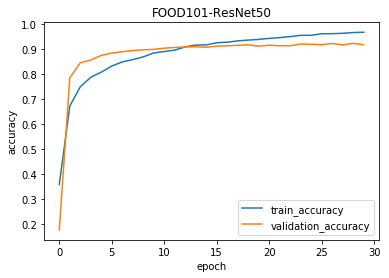

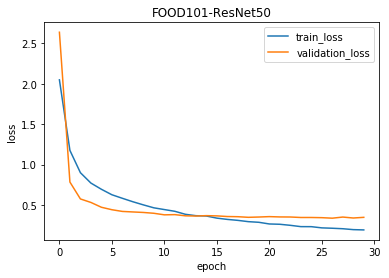

In [44]:
plot_accuracy(history_11class,'FOOD101-ResNet50')
plot_loss(history_11class,'FOOD101-ResNet50')

In [45]:
%%time
# Loading the best saved model to make predictions
K.clear_session()
model_best = load_model('/kaggle/working/best_model_11class.hdf5',compile = False)

CPU times: user 6.88 s, sys: 165 ms, total: 7.05 s
Wall time: 7.05 s


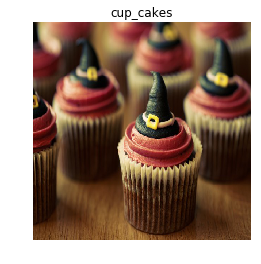

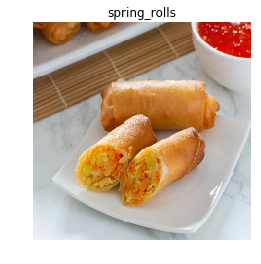

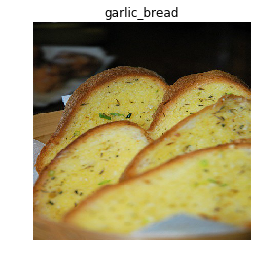

In [47]:
# Make a list of downloaded images and test the trained model
images = []
images.append('cupcakes.jpg')
# images.append('pizza.jpg')
images.append('springrolls.jpg')
images.append('garlicbread.jpg')
predict_class(model_best, images, True)